# Actual Thing

## Import things


In [ ]:
import matplotlib.pyplot as plt
import os, torch

# for prepro
import random
from torchvision import transforms
import torchvision.transforms.functional as F
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# for DataLoader
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import ImageFolder
from collections import Counter

## Import Vision Transformer from torchvision
from torchvision.models import vit_b_16, vit_b_32, vit_l_16, vit_l_32, vit_h_14
import torch.nn as nn

from sklearn.metrics import confusion_matrix

# For ViT
import torch.optim as optim

import time  # to measure time per epoch
from tqdm import tqdm

from sklearn.metrics import classification_report

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


## Load Data

In [ ]:
dataset_path = '/content/drive/My Drive/TA/Histogram Matched'

## Visualize Data

Class: R25 (Very Dark), Count: 450
Class: R35 (Dark), Count: 450
Class: R45 (Moderately Dark), Count: 450
Class: R55 (Medium), Count: 450
Class: R65 (Medium Light), Count: 450
Class: R75 (Light), Count: 450
Class: R85 (Very Light), Count: 450
Class: R95 (Extremely Light), Count: 450


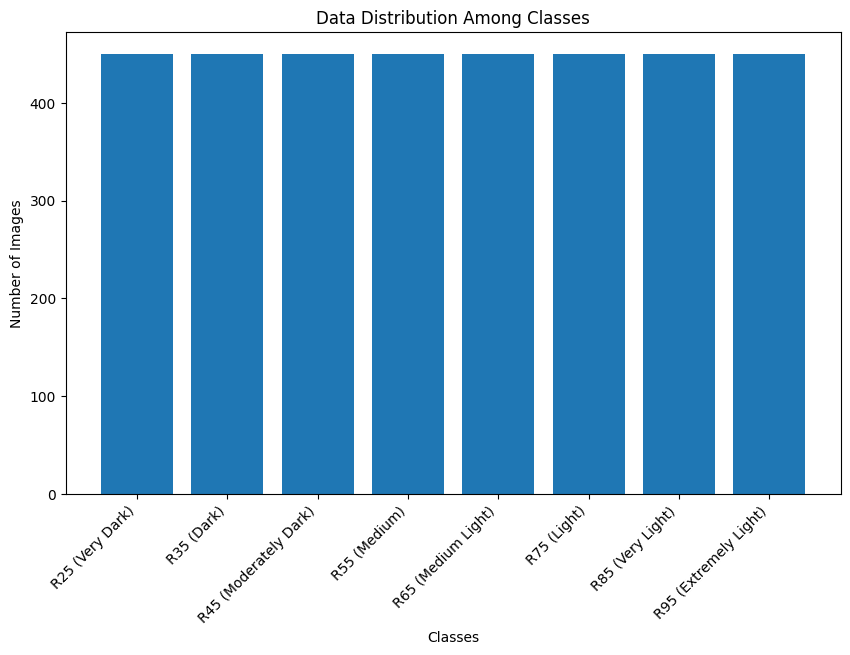

In [ ]:
# Get the class names (subfolder names)
class_names = sorted(os.listdir(dataset_path))

# Initialize a dictionary to store class distribution
class_distribution = {}

# Loop over each class folder
for class_name in class_names:
    class_folder = os.path.join(dataset_path, class_name)
    # Count the number of files (images) in each folder
    num_files = len(os.listdir(class_folder))
    class_distribution[class_name] = num_files

# Print the class distribution
for class_name, count in class_distribution.items():
    print(f'Class: {class_name}, Count: {count}')

# Plot the distribution as a bar chart
plt.figure(figsize=(10, 6))
plt.bar(class_distribution.keys(), class_distribution.values())
plt.xticks(rotation=45, ha='right')
plt.title('Data Distribution Among Classes')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.show()

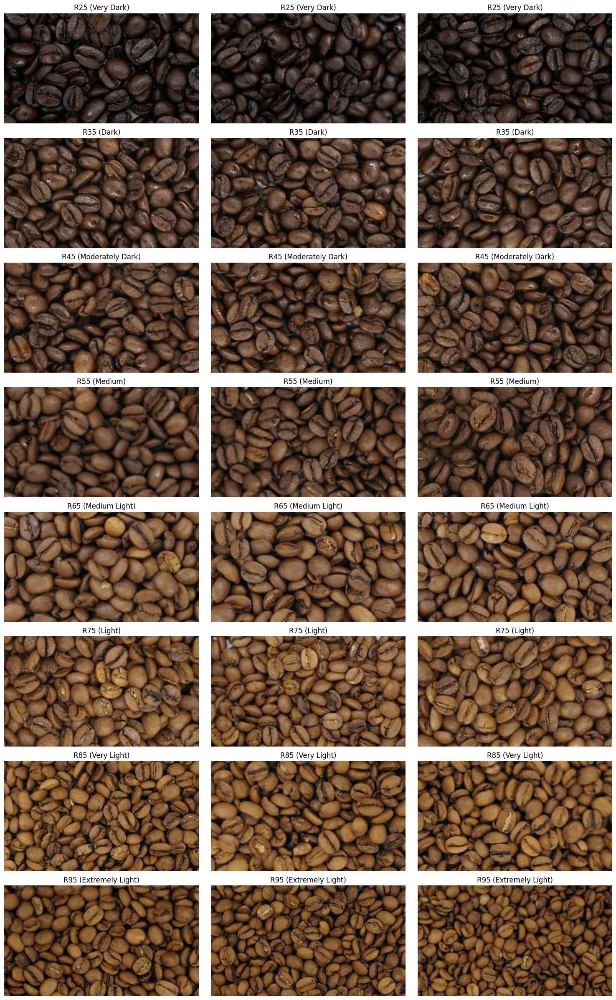

In [ ]:
import random
from PIL import Image

# Get the class names (subfolder names)
class_names = sorted(os.listdir(dataset_path))

# Set the number of samples you want to display per class
num_samples_per_class = 3

# Initialize a figure
plt.figure(figsize=(15, len(class_names) * 3))

# Loop over each class folder and display image samples
for i, class_name in enumerate(class_names):
    class_folder = os.path.join(dataset_path, class_name)
    # Get a list of all image files in the class folder
    image_files = os.listdir(class_folder)

    # Randomly select a few images from the class folder
    sample_images = random.sample(image_files, num_samples_per_class)

    # Loop through the selected images
    for j, image_file in enumerate(sample_images):
        # Load the image
        img_path = os.path.join(class_folder, image_file)
        img = Image.open(img_path)

        # Plot the image
        plt.subplot(len(class_names), num_samples_per_class, i * num_samples_per_class + j + 1)
        plt.imshow(img)
        plt.title(f'{class_name}')
        plt.axis('off')

# Show the plot
plt.tight_layout()
plt.show()

## Preprocessing

In [ ]:
# Custom transform to include Equalization
class EqualizeTransform:
    def __call__(self, img):
        return F.equalize(img)

# Custom function to apply sharpening
def sharpen_image(image):
    return image.filter(ImageFilter.SHARPEN)

# Define the preprocessing pipeline
preprocessed_images = transforms.Compose([
    transforms.RandomResizedCrop((224, 224)),
    transforms.Lambda(lambda img: sharpen_image(img)),
    transforms.ColorJitter(
        # brightness=0.1,
        # contrast=0.2,
        # saturation=0.2,
    #    hue=0.2  # Adjust color variations
    ),
    #EqualizeTransform(),  # Apply equalization
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    #transforms.ToPILImage(),
])

images_to_display = transforms.Compose([
    transforms.RandomResizedCrop((224, 224)),
    transforms.Lambda(lambda img: sharpen_image(img)),
    transforms.ColorJitter(
        # brightness=0.1,
        # contrast=0.2,
        # saturation=0.2,
        #hue=0.2  # Adjust color variations
    ),
    #EqualizeTransform(),  # Apply equalization
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.ToPILImage(),
])

no_preprocessing = transforms.Compose([
    transforms.RandomResizedCrop((224, 224)),
    transforms.ToTensor(),
])


Class: R25 (Very Dark)


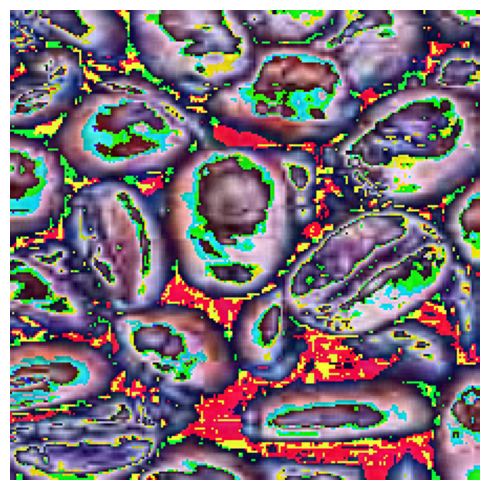

Class: R35 (Dark)


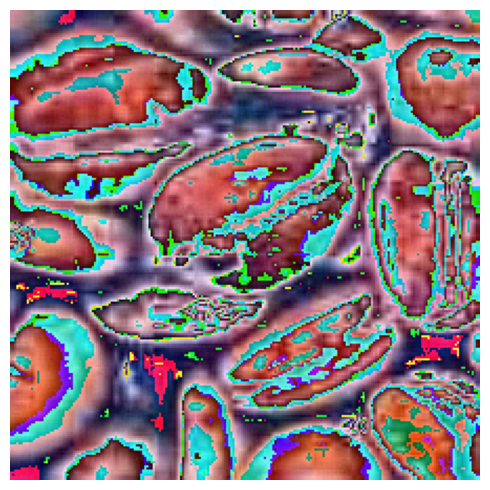

Class: R45 (Moderately Dark)


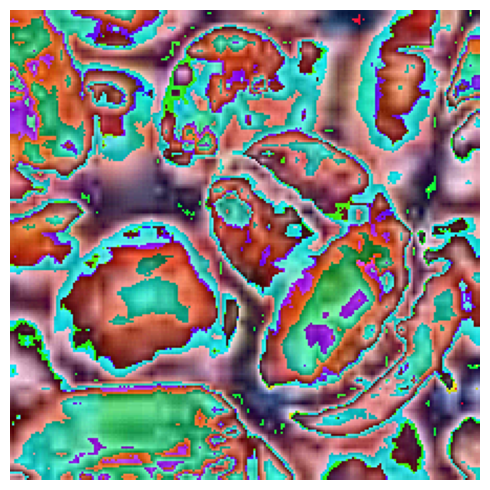

Class: R55 (Medium)


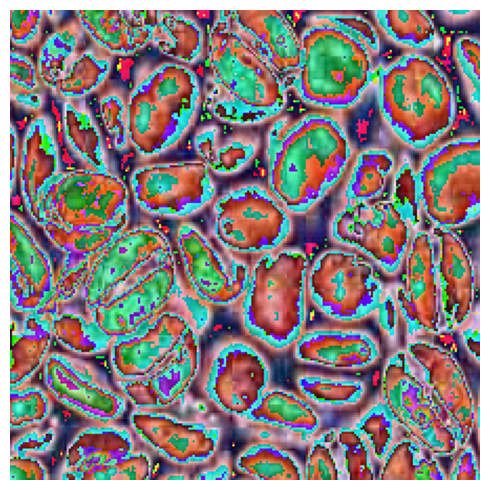

Class: R65 (Medium Light)


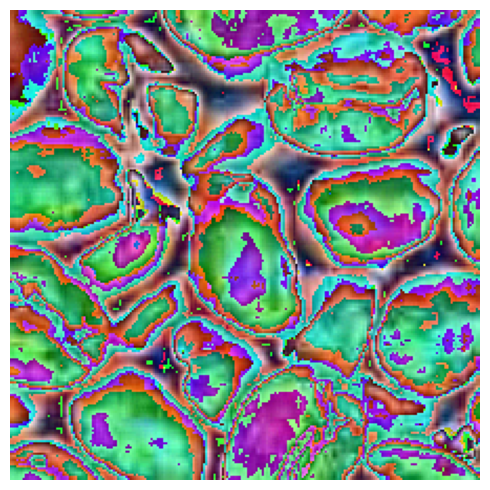

Class: R75 (Light)


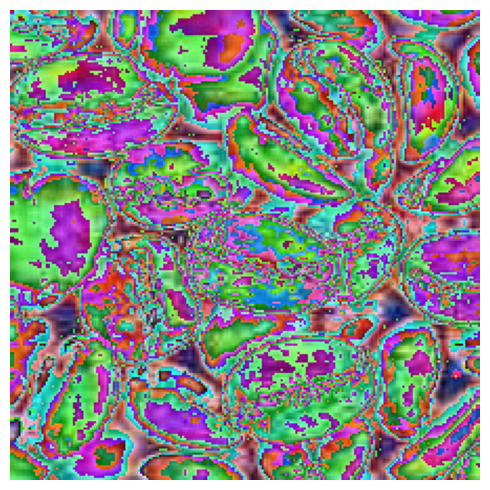

Class: R85 (Very Light)


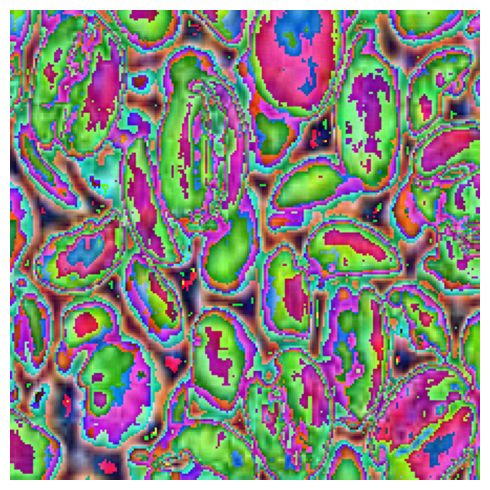

Class: R95 (Extremely Light)


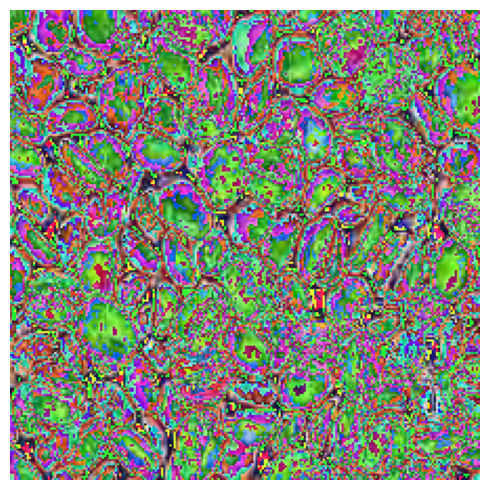

In [ ]:
# Sort the class names (subfolder names)
class_names = sorted(os.listdir(dataset_path))

# Loop over each class folder and display a single image sample
for class_name in class_names:
    class_folder = os.path.join(dataset_path, class_name)
    # Get a list of all image files in the class folder
    image_files = os.listdir(class_folder)

    # Randomly select a single image from the class folder
    image_file = random.choice(image_files)

    # Load the image
    img_path = os.path.join(class_folder, image_file)
    img = Image.open(img_path)

    # Apply preprocessing (assuming `images_to_display` is defined)
    preprocessed_img = images_to_display(img)

    # Print the class name
    print(f'Class: {class_name}')

    # Initialize a separate figure for each class
    plt.figure(figsize=(5, 5))
    plt.imshow(preprocessed_img)
    plt.axis('off')

    # Show the plot
    plt.tight_layout()
    plt.show()

### DataLoader

In [11]:
# Load the dataset with no subset limit
dataset = ImageFolder(root=dataset_path, transform=preprocessed_images)

# Split the dataset into training, validation, and test sets (80%, 10%, 10%)
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)


In [ ]:
# Get class names from the dataset
class_names = {v: k for k, v in train_loader.dataset.dataset.class_to_idx.items()}  # Reverse the mapping
target_names = [class_names[i] for i in range(len(class_names))]

In [ ]:
print(len(train_dataset), len(val_dataset), len(test_dataset))

# Count the number of images per class in each split
def count_images_per_class(dataset):
    class_counts = Counter()
    for idx in dataset.indices:  # Access indices in the subset
        _, label = dataset.dataset.samples[idx]  # Get the label from the original dataset
        class_counts[label] += 1
    return class_counts

# Get class counts for training, validation, and test datasets
train_class_counts = count_images_per_class(train_dataset)
val_class_counts = count_images_per_class(val_dataset)
test_class_counts = count_images_per_class(test_dataset)

# Map the class indices back to their names using the dataset class_to_idx mapping
class_names = {v: k for k, v in dataset.class_to_idx.items()}

# Display the results
print("Training set class distribution:")
for class_idx, count in train_class_counts.items():
    print(f"{class_names[class_idx]}: {count} images")

print("\nValidation set class distribution:")
for class_idx, count in val_class_counts.items():
    print(f"{class_names[class_idx]}: {count} images")

print("\nTest set class distribution:")
for class_idx, count in test_class_counts.items():
    print(f"{class_names[class_idx]}: {count} images")


# ViT-b-32

### Create Model

#### Initialize ViT Model

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize Vision Transformer from scratch
vit_model = vit_b_32(weights=False)

# Modify the classifier head for 8 classes (coffee bean roast levels)
vit_model.heads = nn.Linear(vit_model.heads.head.in_features, 8)

# Move the model to GPU (if available)
vit_model.to(device)

# Extract hyperparameters from the model
print("Model Hyperparameters:")
print(f"Patch size: {vit_model.patch_size}")
print(f"Embedding dimension: {vit_model.hidden_dim}")
print(f"Number of encoder layers: {len(vit_model.encoder.layers)}")  # Number of transformer blocks
print(f"Number of attention heads: {vit_model.encoder.layers[0].self_attention.num_heads}")  # Access the first layer
print(f"MLP dimension: {vit_model.encoder.layers[0].mlp[0].in_features}")  # Access MLP in the first layer
print(f"Number of classes: {vit_model.num_classes}")
print(f"Image size: {vit_model.image_size}")
print(f"Dropout rate: {vit_model.encoder.dropout}")

c:\Users\DHAFINDRA\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Model Hyperparameters:
Patch size: 32
Embedding dimension: 768
Number of encoder layers: 12
Number of attention heads: 12
MLP dimension: 768
Number of classes: 1000
Image size: 224
Dropout rate: Dropout(p=0.0, inplace=False)


#### Define Loss and Optimizer

In [ ]:
## Define Loss and Optimizer
criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.AdamW(vit_model.parameters(), lr=1e-5, weight_decay=0.01)

### Training

In [ ]:
num_epochs = 100
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []
best_val_accuracy = 0.0
best_model_path = f'best_weights_vit_b_32.pth'

for epoch in range(num_epochs):
    vit_model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    start_time = time.time()  # Record start time for each epoch

    with tqdm(total=len(train_loader), desc=f"Epoch {epoch+1}/{num_epochs}", unit='batch') as pbar:
        for batch_idx, (inputs, labels) in enumerate(train_loader):
            inputs, labels = inputs.to(device), labels.long().to(device)

            optimizer.zero_grad()

            # Forward pass
            outputs = vit_model(inputs)
            loss = criterion(outputs, labels)

            # Backward pass and optimization
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Track accuracy for training set
            _, predicted_train = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted_train == labels).sum().item()

            # Custom metrics to display in tqdm bar
            current_loss = loss.item()
            avg_loss = running_loss / (batch_idx + 1)  # Running average loss

            # Update tqdm bar with custom metrics
            pbar.set_postfix({
                'Batch Loss': current_loss,
                'Avg Loss': avg_loss,
                'LR': optimizer.param_groups[0]['lr']  # Display current learning rate
            })
            pbar.update(1)

    # Record the epoch loss and accuracy for training
    avg_epoch_loss = running_loss / len(train_loader)
    train_losses.append(avg_epoch_loss)
    train_accuracy = 100 * correct_train / total_train
    train_accuracies.append(train_accuracy)

    # Validation after each epoch
    vit_model.eval()
    correct_val = 0
    total_val = 0
    running_val_loss = 0.0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = vit_model(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()

            _, predicted_val = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (predicted_val == labels).sum().item()

    avg_val_loss = running_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    val_accuracy = 100 * correct_val / total_val
    val_accuracies.append(val_accuracy)

    # Save the model if validation accuracy improves
    if val_accuracy > best_val_accuracy:
        best_val_accuracy = val_accuracy
        torch.save(vit_model.state_dict(), best_model_path)
        print(f'Best model saved with Val Acc: {val_accuracy}%')

    # Calculate and display epoch duration
    epoch_duration = time.time() - start_time
    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {avg_epoch_loss}, Train Acc: {train_accuracy}%, Val Loss: {avg_val_loss}, Val Acc: {val_accuracy}%, Time: {epoch_duration:.2f}s')

# Load the best model weights after training
vit_model.load_state_dict(torch.load(best_model_path))
print(f"Loaded best model weights with Val Acc: {best_val_accuracy}%")


Epoch 1/100: 100%|██████████| 180/180 [01:21<00:00,  2.21batch/s, Batch Loss=0.358, Avg Loss=0.835, LR=1e-5]


Best model saved with Val Acc: 85.27777777777777%
Epoch 1/100, Train Loss: 0.8353485052784284, Train Acc: 65.06944444444444%, Val Loss: 0.3370061383947082, Val Acc: 85.27777777777777%, Time: 84.67s


Epoch 2/100: 100%|██████████| 180/180 [01:00<00:00,  2.99batch/s, Batch Loss=0.543, Avg Loss=0.314, LR=1e-5] 


Best model saved with Val Acc: 93.33333333333333%
Epoch 2/100, Train Loss: 0.3138380461061994, Train Acc: 86.73611111111111%, Val Loss: 0.19205453279225723, Val Acc: 93.33333333333333%, Time: 62.77s


Epoch 3/100: 100%|██████████| 180/180 [01:00<00:00,  3.00batch/s, Batch Loss=0.182, Avg Loss=0.26, LR=1e-5]  


Best model saved with Val Acc: 96.66666666666667%
Epoch 3/100, Train Loss: 0.259856855445024, Train Acc: 89.75694444444444%, Val Loss: 0.1402589479542297, Val Acc: 96.66666666666667%, Time: 63.18s


Epoch 4/100: 100%|██████████| 180/180 [00:51<00:00,  3.50batch/s, Batch Loss=0.216, Avg Loss=0.187, LR=1e-5] 


Best model saved with Val Acc: 96.94444444444444%
Epoch 4/100, Train Loss: 0.1870026659168717, Train Acc: 92.88194444444444%, Val Loss: 0.12025746443997258, Val Acc: 96.94444444444444%, Time: 53.98s


Epoch 5/100: 100%|██████████| 180/180 [00:49<00:00,  3.63batch/s, Batch Loss=0.0362, Avg Loss=0.201, LR=1e-5]


Epoch 5/100, Train Loss: 0.20143289213172264, Train Acc: 91.70138888888889%, Val Loss: 0.10653348011976999, Val Acc: 94.72222222222223%, Time: 52.03s


Epoch 6/100: 100%|██████████| 180/180 [00:47<00:00,  3.80batch/s, Batch Loss=0.22, Avg Loss=0.162, LR=1e-5]  


Epoch 6/100, Train Loss: 0.1619350707675848, Train Acc: 93.50694444444444%, Val Loss: 0.4849828267874925, Val Acc: 80.55555555555556%, Time: 49.58s


Epoch 7/100: 100%|██████████| 180/180 [00:47<00:00,  3.78batch/s, Batch Loss=0.251, Avg Loss=0.237, LR=1e-5] 


Epoch 7/100, Train Loss: 0.2365098366048187, Train Acc: 90.03472222222223%, Val Loss: 0.0917140449417512, Val Acc: 96.66666666666667%, Time: 49.77s


Epoch 8/100: 100%|██████████| 180/180 [00:44<00:00,  4.05batch/s, Batch Loss=0.223, Avg Loss=0.136, LR=1e-5]  


Epoch 8/100, Train Loss: 0.13609589728681992, Train Acc: 94.20138888888889%, Val Loss: 0.13095896942136082, Val Acc: 96.38888888888889%, Time: 46.53s


Epoch 9/100: 100%|██████████| 180/180 [00:45<00:00,  3.99batch/s, Batch Loss=0.125, Avg Loss=0.19, LR=1e-5]  


Epoch 9/100, Train Loss: 0.19011726515988508, Train Acc: 93.05555555555556%, Val Loss: 0.11151069418891617, Val Acc: 95.55555555555556%, Time: 47.09s


Epoch 10/100: 100%|██████████| 180/180 [00:44<00:00,  4.08batch/s, Batch Loss=0.0202, Avg Loss=0.15, LR=1e-5]  


Epoch 10/100, Train Loss: 0.1504953497192926, Train Acc: 93.99305555555556%, Val Loss: 0.09888480220030507, Val Acc: 96.66666666666667%, Time: 46.18s


Epoch 11/100: 100%|██████████| 180/180 [00:44<00:00,  4.07batch/s, Batch Loss=0.0231, Avg Loss=0.136, LR=1e-5] 


Epoch 11/100, Train Loss: 0.1360818815210627, Train Acc: 94.27083333333333%, Val Loss: 0.19036167226326856, Val Acc: 92.22222222222223%, Time: 46.17s


Epoch 12/100: 100%|██████████| 180/180 [00:44<00:00,  4.08batch/s, Batch Loss=0.0922, Avg Loss=0.164, LR=1e-5] 


Best model saved with Val Acc: 98.61111111111111%
Epoch 12/100, Train Loss: 0.16438378311124527, Train Acc: 92.53472222222223%, Val Loss: 0.06262149663804017, Val Acc: 98.61111111111111%, Time: 46.61s


Epoch 13/100: 100%|██████████| 180/180 [00:44<00:00,  4.06batch/s, Batch Loss=0.325, Avg Loss=0.152, LR=1e-5]  


Epoch 13/100, Train Loss: 0.15153023009705874, Train Acc: 93.71527777777777%, Val Loss: 0.10252665485376897, Val Acc: 96.38888888888889%, Time: 46.36s


Epoch 14/100: 100%|██████████| 180/180 [00:44<00:00,  4.06batch/s, Batch Loss=0.116, Avg Loss=0.113, LR=1e-5]  


Epoch 14/100, Train Loss: 0.11341063436379449, Train Acc: 95.48611111111111%, Val Loss: 0.05262080831048281, Val Acc: 98.05555555555556%, Time: 46.48s


Epoch 15/100: 100%|██████████| 180/180 [00:45<00:00,  3.97batch/s, Batch Loss=0.0294, Avg Loss=0.124, LR=1e-5] 


Epoch 15/100, Train Loss: 0.12350218863252344, Train Acc: 95.03472222222223%, Val Loss: 0.07186767124854353, Val Acc: 97.22222222222223%, Time: 47.87s


Epoch 16/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.0349, Avg Loss=0.11, LR=1e-5]  


Epoch 16/100, Train Loss: 0.11014753438196041, Train Acc: 95.45138888888889%, Val Loss: 0.12462178118648412, Val Acc: 95.55555555555556%, Time: 51.70s


Epoch 17/100: 100%|██████████| 180/180 [00:47<00:00,  3.78batch/s, Batch Loss=0.227, Avg Loss=0.139, LR=1e-5]  


Epoch 17/100, Train Loss: 0.13870146170310263, Train Acc: 94.82638888888889%, Val Loss: 0.058389889805213264, Val Acc: 98.61111111111111%, Time: 49.89s


Epoch 18/100: 100%|██████████| 180/180 [00:52<00:00,  3.43batch/s, Batch Loss=0.0373, Avg Loss=0.1, LR=1e-5]    


Epoch 18/100, Train Loss: 0.10003784690181622, Train Acc: 96.07638888888889%, Val Loss: 0.0569764213565656, Val Acc: 97.5%, Time: 55.14s


Epoch 19/100: 100%|██████████| 180/180 [00:54<00:00,  3.30batch/s, Batch Loss=0.0453, Avg Loss=0.13, LR=1e-5]  


Epoch 19/100, Train Loss: 0.12951747938576672, Train Acc: 94.79166666666667%, Val Loss: 0.22864217084387076, Val Acc: 89.44444444444444%, Time: 56.70s


Epoch 20/100: 100%|██████████| 180/180 [00:51<00:00,  3.48batch/s, Batch Loss=0.00557, Avg Loss=0.116, LR=1e-5]


Epoch 20/100, Train Loss: 0.11603411443324553, Train Acc: 95.38194444444444%, Val Loss: 0.06682278673447993, Val Acc: 97.22222222222223%, Time: 54.55s


Epoch 21/100: 100%|██████████| 180/180 [00:50<00:00,  3.60batch/s, Batch Loss=0.0593, Avg Loss=0.0957, LR=1e-5] 


Epoch 21/100, Train Loss: 0.09566076446208172, Train Acc: 96.31944444444444%, Val Loss: 0.08202032189634022, Val Acc: 96.11111111111111%, Time: 52.17s


Epoch 22/100: 100%|██████████| 180/180 [00:48<00:00,  3.69batch/s, Batch Loss=0.00712, Avg Loss=0.111, LR=1e-5]


Epoch 22/100, Train Loss: 0.11128629047630562, Train Acc: 96.11111111111111%, Val Loss: 0.0875555334167312, Val Acc: 95.55555555555556%, Time: 50.95s


Epoch 23/100: 100%|██████████| 180/180 [00:46<00:00,  3.84batch/s, Batch Loss=0.0598, Avg Loss=0.123, LR=1e-5] 


Epoch 23/100, Train Loss: 0.12304044577952784, Train Acc: 95.06944444444444%, Val Loss: 0.05455364340551845, Val Acc: 98.33333333333333%, Time: 49.05s


Epoch 24/100: 100%|██████████| 180/180 [00:47<00:00,  3.82batch/s, Batch Loss=0.225, Avg Loss=0.107, LR=1e-5]   


Epoch 24/100, Train Loss: 0.10651512849015288, Train Acc: 95.9375%, Val Loss: 0.3748570732094105, Val Acc: 87.77777777777777%, Time: 49.25s


Epoch 25/100: 100%|██████████| 180/180 [00:54<00:00,  3.29batch/s, Batch Loss=0.215, Avg Loss=0.122, LR=1e-5]  


Epoch 25/100, Train Loss: 0.12226312021246283, Train Acc: 95.06944444444444%, Val Loss: 0.06568007387787751, Val Acc: 96.94444444444444%, Time: 57.04s


Epoch 26/100: 100%|██████████| 180/180 [00:54<00:00,  3.29batch/s, Batch Loss=0.125, Avg Loss=0.105, LR=1e-5]   


Best model saved with Val Acc: 99.16666666666667%
Epoch 26/100, Train Loss: 0.10526478885052105, Train Acc: 95.79861111111111%, Val Loss: 0.03817953021549012, Val Acc: 99.16666666666667%, Time: 57.61s


Epoch 27/100: 100%|██████████| 180/180 [00:57<00:00,  3.13batch/s, Batch Loss=0.0633, Avg Loss=0.0861, LR=1e-5] 


Epoch 27/100, Train Loss: 0.08606354677273581, Train Acc: 96.5625%, Val Loss: 0.06728330707562197, Val Acc: 97.5%, Time: 59.94s


Epoch 28/100: 100%|██████████| 180/180 [00:54<00:00,  3.30batch/s, Batch Loss=0.193, Avg Loss=0.122, LR=1e-5]  


Epoch 28/100, Train Loss: 0.12174793141053265, Train Acc: 95.38194444444444%, Val Loss: 0.057229823706185685, Val Acc: 98.05555555555556%, Time: 56.88s


Epoch 29/100: 100%|██████████| 180/180 [00:51<00:00,  3.48batch/s, Batch Loss=0.0787, Avg Loss=0.0848, LR=1e-5] 


Epoch 29/100, Train Loss: 0.08476940972549427, Train Acc: 96.84027777777777%, Val Loss: 0.05819906680034879, Val Acc: 97.22222222222223%, Time: 54.06s


Epoch 30/100: 100%|██████████| 180/180 [00:51<00:00,  3.52batch/s, Batch Loss=0.0213, Avg Loss=0.126, LR=1e-5] 


Epoch 30/100, Train Loss: 0.1263932850477027, Train Acc: 95.03472222222223%, Val Loss: 0.05713863460139534, Val Acc: 98.05555555555556%, Time: 53.74s


Epoch 31/100: 100%|██████████| 180/180 [00:56<00:00,  3.21batch/s, Batch Loss=0.397, Avg Loss=0.0872, LR=1e-5]  


Epoch 31/100, Train Loss: 0.0872255955832467, Train Acc: 96.42361111111111%, Val Loss: 0.07266388197793909, Val Acc: 96.94444444444444%, Time: 58.80s


Epoch 32/100: 100%|██████████| 180/180 [00:53<00:00,  3.35batch/s, Batch Loss=0.00706, Avg Loss=0.0998, LR=1e-5] 


Epoch 32/100, Train Loss: 0.09980144185958327, Train Acc: 95.90277777777777%, Val Loss: 0.053375741466879845, Val Acc: 97.77777777777777%, Time: 56.05s


Epoch 33/100: 100%|██████████| 180/180 [00:52<00:00,  3.44batch/s, Batch Loss=0.0755, Avg Loss=0.0961, LR=1e-5] 


Epoch 33/100, Train Loss: 0.09607821682244927, Train Acc: 96.21527777777777%, Val Loss: 0.08461499540135264, Val Acc: 95.83333333333333%, Time: 54.55s


Epoch 34/100: 100%|██████████| 180/180 [00:54<00:00,  3.32batch/s, Batch Loss=0.37, Avg Loss=0.102, LR=1e-5]    


Epoch 34/100, Train Loss: 0.10159334950052047, Train Acc: 95.83333333333333%, Val Loss: 0.16438010974746683, Val Acc: 94.44444444444444%, Time: 56.63s


Epoch 35/100: 100%|██████████| 180/180 [00:51<00:00,  3.52batch/s, Batch Loss=0.0825, Avg Loss=0.0912, LR=1e-5] 


Epoch 35/100, Train Loss: 0.09123209617876758, Train Acc: 96.73611111111111%, Val Loss: 0.04518464358482996, Val Acc: 97.77777777777777%, Time: 53.50s


Epoch 36/100: 100%|██████████| 180/180 [00:50<00:00,  3.55batch/s, Batch Loss=0.00751, Avg Loss=0.0792, LR=1e-5]


Epoch 36/100, Train Loss: 0.07921501381497364, Train Acc: 97.11805555555556%, Val Loss: 0.07113344358968669, Val Acc: 97.5%, Time: 52.79s


Epoch 37/100: 100%|██████████| 180/180 [00:46<00:00,  3.85batch/s, Batch Loss=0.00263, Avg Loss=0.1, LR=1e-5]  


Epoch 37/100, Train Loss: 0.1003690925336236, Train Acc: 95.9375%, Val Loss: 0.12615400559329631, Val Acc: 94.16666666666667%, Time: 48.85s


Epoch 38/100: 100%|██████████| 180/180 [00:48<00:00,  3.70batch/s, Batch Loss=0.311, Avg Loss=0.114, LR=1e-5]  


Epoch 38/100, Train Loss: 0.11364774125071966, Train Acc: 95.45138888888889%, Val Loss: 0.05234760182287099, Val Acc: 97.22222222222223%, Time: 51.05s


Epoch 39/100: 100%|██████████| 180/180 [00:47<00:00,  3.77batch/s, Batch Loss=0.039, Avg Loss=0.0952, LR=1e-5]  


Epoch 39/100, Train Loss: 0.09520288502034317, Train Acc: 96.38888888888889%, Val Loss: 0.29651080756245746, Val Acc: 86.38888888888889%, Time: 50.21s


Epoch 40/100: 100%|██████████| 180/180 [00:47<00:00,  3.81batch/s, Batch Loss=0.00865, Avg Loss=0.107, LR=1e-5] 


Epoch 40/100, Train Loss: 0.10686233188672405, Train Acc: 95.86805555555556%, Val Loss: 0.07368997879751513, Val Acc: 96.94444444444444%, Time: 49.40s


Epoch 41/100: 100%|██████████| 180/180 [00:47<00:00,  3.82batch/s, Batch Loss=0.0736, Avg Loss=0.107, LR=1e-5] 


Epoch 41/100, Train Loss: 0.10731135773110306, Train Acc: 95.72916666666667%, Val Loss: 0.1337871312710416, Val Acc: 93.88888888888889%, Time: 49.20s


Epoch 42/100: 100%|██████████| 180/180 [00:46<00:00,  3.88batch/s, Batch Loss=0.00925, Avg Loss=0.118, LR=1e-5]


Epoch 42/100, Train Loss: 0.1182008740304607, Train Acc: 95.10416666666667%, Val Loss: 0.06983987590217072, Val Acc: 97.22222222222223%, Time: 48.47s


Epoch 43/100: 100%|██████████| 180/180 [00:49<00:00,  3.66batch/s, Batch Loss=0.0239, Avg Loss=0.0901, LR=1e-5] 


Epoch 43/100, Train Loss: 0.09013298882249123, Train Acc: 96.18055555555556%, Val Loss: 0.10851031703793484, Val Acc: 95.55555555555556%, Time: 51.25s


Epoch 44/100: 100%|██████████| 180/180 [00:47<00:00,  3.80batch/s, Batch Loss=0.0411, Avg Loss=0.0832, LR=1e-5] 


Epoch 44/100, Train Loss: 0.08317611268171782, Train Acc: 97.1875%, Val Loss: 0.031449014419669526, Val Acc: 98.61111111111111%, Time: 49.50s


Epoch 45/100: 100%|██████████| 180/180 [00:45<00:00,  3.92batch/s, Batch Loss=0.0344, Avg Loss=0.0999, LR=1e-5]


Epoch 45/100, Train Loss: 0.0999321701571009, Train Acc: 96.07638888888889%, Val Loss: 0.03942661482395361, Val Acc: 99.16666666666667%, Time: 48.36s


Epoch 46/100: 100%|██████████| 180/180 [00:46<00:00,  3.91batch/s, Batch Loss=0.00974, Avg Loss=0.0828, LR=1e-5]


Epoch 46/100, Train Loss: 0.08279850604594685, Train Acc: 96.875%, Val Loss: 0.058014262578976544, Val Acc: 97.22222222222223%, Time: 48.24s


Epoch 47/100: 100%|██████████| 180/180 [00:45<00:00,  3.98batch/s, Batch Loss=0.00337, Avg Loss=0.0844, LR=1e-5]


Epoch 47/100, Train Loss: 0.08436680824767488, Train Acc: 97.01388888888889%, Val Loss: 0.055527821770342795, Val Acc: 98.05555555555556%, Time: 47.52s


Epoch 48/100: 100%|██████████| 180/180 [00:46<00:00,  3.83batch/s, Batch Loss=0.0221, Avg Loss=0.0988, LR=1e-5] 


Epoch 48/100, Train Loss: 0.09881605162324074, Train Acc: 96.14583333333333%, Val Loss: 0.07211812576481505, Val Acc: 97.22222222222223%, Time: 49.14s


Epoch 49/100: 100%|██████████| 180/180 [00:47<00:00,  3.81batch/s, Batch Loss=0.0414, Avg Loss=0.0708, LR=1e-5]  


Epoch 49/100, Train Loss: 0.07075593866934973, Train Acc: 97.53472222222223%, Val Loss: 0.048782006493243185, Val Acc: 98.61111111111111%, Time: 49.68s


Epoch 50/100: 100%|██████████| 180/180 [00:47<00:00,  3.77batch/s, Batch Loss=0.0564, Avg Loss=0.0969, LR=1e-5] 


Epoch 50/100, Train Loss: 0.09692334801980501, Train Acc: 96.25%, Val Loss: 0.0576940384167044, Val Acc: 97.77777777777777%, Time: 49.87s


Epoch 51/100: 100%|██████████| 180/180 [00:49<00:00,  3.67batch/s, Batch Loss=0.0961, Avg Loss=0.1, LR=1e-5]   


Epoch 51/100, Train Loss: 0.1002697684090688, Train Acc: 96.63194444444444%, Val Loss: 0.06229646415854602, Val Acc: 98.33333333333333%, Time: 51.18s


Epoch 52/100: 100%|██████████| 180/180 [00:48<00:00,  3.70batch/s, Batch Loss=0.0169, Avg Loss=0.0845, LR=1e-5] 


Epoch 52/100, Train Loss: 0.08447305068839342, Train Acc: 96.84027777777777%, Val Loss: 0.0924425186265422, Val Acc: 95.83333333333333%, Time: 50.95s


Epoch 53/100: 100%|██████████| 180/180 [00:52<00:00,  3.41batch/s, Batch Loss=0.0112, Avg Loss=0.0843, LR=1e-5] 


Epoch 53/100, Train Loss: 0.08427988315492661, Train Acc: 96.84027777777777%, Val Loss: 0.12863918841163546, Val Acc: 95.55555555555556%, Time: 55.14s


Epoch 54/100: 100%|██████████| 180/180 [00:45<00:00,  4.00batch/s, Batch Loss=0.00734, Avg Loss=0.105, LR=1e-5] 


Epoch 54/100, Train Loss: 0.10455703705568643, Train Acc: 95.97222222222223%, Val Loss: 0.08661438464996932, Val Acc: 97.22222222222223%, Time: 47.17s


Epoch 55/100: 100%|██████████| 180/180 [00:48<00:00,  3.71batch/s, Batch Loss=0.0161, Avg Loss=0.0925, LR=1e-5] 


Epoch 55/100, Train Loss: 0.09253054467521402, Train Acc: 96.70138888888889%, Val Loss: 0.04844788244024486, Val Acc: 98.33333333333333%, Time: 50.88s


Epoch 56/100: 100%|██████████| 180/180 [00:56<00:00,  3.20batch/s, Batch Loss=0.00386, Avg Loss=0.116, LR=1e-5]


Epoch 56/100, Train Loss: 0.11563196665374562, Train Acc: 95.90277777777777%, Val Loss: 0.08064148105357004, Val Acc: 96.94444444444444%, Time: 58.50s


Epoch 57/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.0223, Avg Loss=0.0876, LR=1e-5] 


Epoch 57/100, Train Loss: 0.08764075330885437, Train Acc: 96.73611111111111%, Val Loss: 0.07225358604615473, Val Acc: 98.05555555555556%, Time: 51.71s


Epoch 58/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.0575, Avg Loss=0.084, LR=1e-5]  


Epoch 58/100, Train Loss: 0.08401201945639009, Train Acc: 96.70138888888889%, Val Loss: 0.07487659399276195, Val Acc: 96.94444444444444%, Time: 51.80s


Epoch 59/100: 100%|██████████| 180/180 [00:49<00:00,  3.63batch/s, Batch Loss=0.114, Avg Loss=0.0948, LR=1e-5]  


Epoch 59/100, Train Loss: 0.09481909660907048, Train Acc: 96.11111111111111%, Val Loss: 0.030867394235784835, Val Acc: 98.88888888888889%, Time: 51.82s


Epoch 60/100: 100%|██████████| 180/180 [00:49<00:00,  3.66batch/s, Batch Loss=0.238, Avg Loss=0.0884, LR=1e-5]  


Epoch 60/100, Train Loss: 0.08838848908878087, Train Acc: 96.63194444444444%, Val Loss: 0.07767484200999404, Val Acc: 96.94444444444444%, Time: 51.41s


Epoch 61/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.1, Avg Loss=0.0757, LR=1e-5]    


Epoch 61/100, Train Loss: 0.07570541052522863, Train Acc: 97.08333333333333%, Val Loss: 0.10428458190796411, Val Acc: 95.83333333333333%, Time: 51.79s


Epoch 62/100: 100%|██████████| 180/180 [00:49<00:00,  3.66batch/s, Batch Loss=0.102, Avg Loss=0.0961, LR=1e-5]  


Epoch 62/100, Train Loss: 0.09606378313619643, Train Acc: 96.14583333333333%, Val Loss: 0.1119142733185309, Val Acc: 96.66666666666667%, Time: 51.48s


Epoch 63/100: 100%|██████████| 180/180 [00:49<00:00,  3.63batch/s, Batch Loss=0.2, Avg Loss=0.0738, LR=1e-5]     


Epoch 63/100, Train Loss: 0.07376987078427596, Train Acc: 97.1875%, Val Loss: 0.07952497382243366, Val Acc: 96.66666666666667%, Time: 51.74s


Epoch 64/100: 100%|██████████| 180/180 [00:49<00:00,  3.65batch/s, Batch Loss=0.0278, Avg Loss=0.0769, LR=1e-5]  


Epoch 64/100, Train Loss: 0.07692934163205792, Train Acc: 97.15277777777777%, Val Loss: 0.056651855788558074, Val Acc: 98.88888888888889%, Time: 52.23s


Epoch 65/100: 100%|██████████| 180/180 [00:53<00:00,  3.38batch/s, Batch Loss=0.13, Avg Loss=0.106, LR=1e-5]   


Epoch 65/100, Train Loss: 0.10605750743222113, Train Acc: 95.97222222222223%, Val Loss: 0.060368511324707906, Val Acc: 98.05555555555556%, Time: 55.43s


Epoch 66/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.446, Avg Loss=0.0809, LR=1e-5]  


Epoch 66/100, Train Loss: 0.080943300421091, Train Acc: 96.77083333333333%, Val Loss: 0.07168638870707186, Val Acc: 97.77777777777777%, Time: 51.68s


Epoch 67/100: 100%|██████████| 180/180 [00:49<00:00,  3.63batch/s, Batch Loss=0.168, Avg Loss=0.105, LR=1e-5]  


Epoch 67/100, Train Loss: 0.10477224771554271, Train Acc: 95.52083333333333%, Val Loss: 0.16221158790564083, Val Acc: 93.61111111111111%, Time: 51.88s


Epoch 68/100: 100%|██████████| 180/180 [00:49<00:00,  3.62batch/s, Batch Loss=0.0134, Avg Loss=0.0829, LR=1e-5]  


Epoch 68/100, Train Loss: 0.08292994182944918, Train Acc: 96.875%, Val Loss: 0.08353717060273756, Val Acc: 97.22222222222223%, Time: 52.08s


Epoch 69/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.0204, Avg Loss=0.0805, LR=1e-5]  


Epoch 69/100, Train Loss: 0.0804586013552681, Train Acc: 96.77083333333333%, Val Loss: 0.10189515147003872, Val Acc: 95.27777777777777%, Time: 51.72s


Epoch 70/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.121, Avg Loss=0.0842, LR=1e-5]  


Epoch 70/100, Train Loss: 0.08417804472200159, Train Acc: 97.01388888888889%, Val Loss: 0.049396774974530155, Val Acc: 98.05555555555556%, Time: 51.62s


Epoch 71/100: 100%|██████████| 180/180 [00:49<00:00,  3.63batch/s, Batch Loss=0.00548, Avg Loss=0.0777, LR=1e-5] 


Epoch 71/100, Train Loss: 0.07770602752166775, Train Acc: 96.94444444444444%, Val Loss: 0.04370317498156193, Val Acc: 98.33333333333333%, Time: 51.91s


Epoch 72/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.0626, Avg Loss=0.086, LR=1e-5]   


Epoch 72/100, Train Loss: 0.08603570862679691, Train Acc: 96.70138888888889%, Val Loss: 0.03415307416783079, Val Acc: 98.88888888888889%, Time: 51.69s


Epoch 73/100: 100%|██████████| 180/180 [00:49<00:00,  3.63batch/s, Batch Loss=0.0639, Avg Loss=0.0745, LR=1e-5] 


Epoch 73/100, Train Loss: 0.07447940538436847, Train Acc: 97.04861111111111%, Val Loss: 0.0542274420807624, Val Acc: 98.33333333333333%, Time: 51.87s


Epoch 74/100: 100%|██████████| 180/180 [00:56<00:00,  3.20batch/s, Batch Loss=0.519, Avg Loss=0.0587, LR=1e-5]   


Epoch 74/100, Train Loss: 0.05874174227291304, Train Acc: 97.91666666666667%, Val Loss: 0.12556733899106368, Val Acc: 95.83333333333333%, Time: 58.41s


Epoch 75/100: 100%|██████████| 180/180 [00:49<00:00,  3.62batch/s, Batch Loss=0.0444, Avg Loss=0.106, LR=1e-5] 


Epoch 75/100, Train Loss: 0.10587309738653453, Train Acc: 96.11111111111111%, Val Loss: 0.07638870297080796, Val Acc: 96.94444444444444%, Time: 52.04s


Epoch 76/100: 100%|██████████| 180/180 [00:49<00:00,  3.63batch/s, Batch Loss=0.0714, Avg Loss=0.0928, LR=1e-5] 


Epoch 76/100, Train Loss: 0.0928200560932358, Train Acc: 96.49305555555556%, Val Loss: 0.07432465118219388, Val Acc: 97.22222222222223%, Time: 51.78s


Epoch 77/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.0616, Avg Loss=0.0748, LR=1e-5]  


Epoch 77/100, Train Loss: 0.07480057100571381, Train Acc: 97.15277777777777%, Val Loss: 0.046111751955164516, Val Acc: 98.05555555555556%, Time: 51.69s


Epoch 78/100: 100%|██████████| 180/180 [00:49<00:00,  3.63batch/s, Batch Loss=0.253, Avg Loss=0.062, LR=1e-5]   


Epoch 78/100, Train Loss: 0.06203310340610591, Train Acc: 97.63888888888889%, Val Loss: 0.0322492134190448, Val Acc: 98.61111111111111%, Time: 51.81s


Epoch 79/100: 100%|██████████| 180/180 [00:49<00:00,  3.61batch/s, Batch Loss=0.061, Avg Loss=0.0918, LR=1e-5]  


Epoch 79/100, Train Loss: 0.09180618819340856, Train Acc: 96.42361111111111%, Val Loss: 0.0764692620192047, Val Acc: 96.94444444444444%, Time: 52.13s


Epoch 80/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.00434, Avg Loss=0.0558, LR=1e-5] 


Epoch 80/100, Train Loss: 0.055768139338437724, Train Acc: 98.02083333333333%, Val Loss: 0.0916679080211274, Val Acc: 96.38888888888889%, Time: 51.76s


Epoch 81/100: 100%|██████████| 180/180 [00:49<00:00,  3.63batch/s, Batch Loss=0.00851, Avg Loss=0.0733, LR=1e-5] 


Epoch 81/100, Train Loss: 0.07334405565068462, Train Acc: 97.15277777777777%, Val Loss: 0.038264099032739585, Val Acc: 98.61111111111111%, Time: 51.88s


Epoch 82/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.231, Avg Loss=0.11, LR=1e-5]    


Epoch 82/100, Train Loss: 0.10979443444036102, Train Acc: 96.14583333333333%, Val Loss: 0.04331040829825013, Val Acc: 98.33333333333333%, Time: 51.66s


Epoch 83/100: 100%|██████████| 180/180 [00:50<00:00,  3.58batch/s, Batch Loss=0.143, Avg Loss=0.0665, LR=1e-5]  


Epoch 83/100, Train Loss: 0.06651931876937549, Train Acc: 97.46527777777777%, Val Loss: 0.060218280343257866, Val Acc: 97.5%, Time: 52.50s


Epoch 84/100: 100%|██████████| 180/180 [00:49<00:00,  3.65batch/s, Batch Loss=0.351, Avg Loss=0.113, LR=1e-5]  


Epoch 84/100, Train Loss: 0.11258872065809555, Train Acc: 96.00694444444444%, Val Loss: 0.040493845802342075, Val Acc: 98.88888888888889%, Time: 51.66s


Epoch 85/100: 100%|██████████| 180/180 [00:49<00:00,  3.61batch/s, Batch Loss=0.0146, Avg Loss=0.0614, LR=1e-5] 


Epoch 85/100, Train Loss: 0.0613904137209627, Train Acc: 97.95138888888889%, Val Loss: 0.04176462747241401, Val Acc: 98.33333333333333%, Time: 52.08s


Epoch 86/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.00326, Avg Loss=0.0716, LR=1e-5]


Epoch 86/100, Train Loss: 0.0716178037966731, Train Acc: 97.53472222222223%, Val Loss: 0.02891289257525426, Val Acc: 98.88888888888889%, Time: 51.64s


Epoch 87/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.00459, Avg Loss=0.0618, LR=1e-5] 


Epoch 87/100, Train Loss: 0.061769159796272614, Train Acc: 97.56944444444444%, Val Loss: 0.038168293761808185, Val Acc: 98.61111111111111%, Time: 51.74s


Epoch 88/100: 100%|██████████| 180/180 [00:49<00:00,  3.66batch/s, Batch Loss=0.000553, Avg Loss=0.0676, LR=1e-5]


Epoch 88/100, Train Loss: 0.06759501809202549, Train Acc: 97.29166666666667%, Val Loss: 0.054215720807247715, Val Acc: 96.94444444444444%, Time: 51.55s


Epoch 89/100: 100%|██████████| 180/180 [00:49<00:00,  3.65batch/s, Batch Loss=0.0584, Avg Loss=0.0546, LR=1e-5]  


Epoch 89/100, Train Loss: 0.05459027567412704, Train Acc: 97.74305555555556%, Val Loss: 0.04643965400907252, Val Acc: 98.88888888888889%, Time: 51.59s


Epoch 90/100: 100%|██████████| 180/180 [00:49<00:00,  3.66batch/s, Batch Loss=0.0592, Avg Loss=0.0896, LR=1e-5] 


Epoch 90/100, Train Loss: 0.08959056162663424, Train Acc: 96.70138888888889%, Val Loss: 0.07002549033369058, Val Acc: 96.11111111111111%, Time: 51.42s


Epoch 91/100: 100%|██████████| 180/180 [00:49<00:00,  3.65batch/s, Batch Loss=0.0159, Avg Loss=0.13, LR=1e-5]  


Epoch 91/100, Train Loss: 0.12981797324027866, Train Acc: 95.41666666666667%, Val Loss: 0.025999732502817136, Val Acc: 98.88888888888889%, Time: 51.61s


Epoch 92/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.0154, Avg Loss=0.0786, LR=1e-5] 


Epoch 92/100, Train Loss: 0.07858838150601109, Train Acc: 97.08333333333333%, Val Loss: 0.07209804141893983, Val Acc: 97.5%, Time: 51.72s


Epoch 93/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.286, Avg Loss=0.0575, LR=1e-5]  


Epoch 93/100, Train Loss: 0.057507564218637224, Train Acc: 97.95138888888889%, Val Loss: 0.03640867563207512, Val Acc: 98.33333333333333%, Time: 51.62s


Epoch 94/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.0129, Avg Loss=0.0853, LR=1e-5] 


Epoch 94/100, Train Loss: 0.08526296931215459, Train Acc: 96.80555555555556%, Val Loss: 0.07101376150714477, Val Acc: 97.5%, Time: 51.64s


Epoch 95/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.01, Avg Loss=0.0664, LR=1e-5]    


Epoch 95/100, Train Loss: 0.06640283954750177, Train Acc: 97.91666666666667%, Val Loss: 0.07411035621518512, Val Acc: 97.22222222222223%, Time: 51.72s


Epoch 96/100: 100%|██████████| 180/180 [00:49<00:00,  3.66batch/s, Batch Loss=0.167, Avg Loss=0.0728, LR=1e-5]  


Epoch 96/100, Train Loss: 0.07283787953169343, Train Acc: 97.11805555555556%, Val Loss: 0.04147407091501088, Val Acc: 98.88888888888889%, Time: 51.43s


Epoch 97/100: 100%|██████████| 180/180 [00:49<00:00,  3.66batch/s, Batch Loss=0.223, Avg Loss=0.0914, LR=1e-5]  


Epoch 97/100, Train Loss: 0.09139699349147526, Train Acc: 96.25%, Val Loss: 0.04323528525824456, Val Acc: 98.61111111111111%, Time: 51.37s


Epoch 98/100: 100%|██████████| 180/180 [00:49<00:00,  3.67batch/s, Batch Loss=0.218, Avg Loss=0.0633, LR=1e-5]   


Epoch 98/100, Train Loss: 0.06334788899694103, Train Acc: 97.60416666666667%, Val Loss: 0.08583293836462595, Val Acc: 97.22222222222223%, Time: 51.34s


Epoch 99/100: 100%|██████████| 180/180 [00:49<00:00,  3.66batch/s, Batch Loss=0.162, Avg Loss=0.0758, LR=1e-5]   


Best model saved with Val Acc: 99.44444444444444%
Epoch 99/100, Train Loss: 0.07577643560168022, Train Acc: 97.08333333333333%, Val Loss: 0.027929638746528603, Val Acc: 99.44444444444444%, Time: 51.88s


Epoch 100/100: 100%|██████████| 180/180 [00:49<00:00,  3.64batch/s, Batch Loss=0.376, Avg Loss=0.0597, LR=1e-5]  


Epoch 100/100, Train Loss: 0.05974669273257152, Train Acc: 97.84722222222223%, Val Loss: 0.042745401214747486, Val Acc: 98.61111111111111%, Time: 51.69s
Loaded best model weights with Val Acc: 99.44444444444444%


#### classification report


In [ ]:
# Load the best model weights
vit_model.load_state_dict(torch.load(best_model_path))
vit_model.eval()

# Training set evaluation
correct_train = 0
total_train = 0

# Initialize lists to store true and predicted labels for training set
all_true_labels_train = []
all_predicted_labels_train = []

with torch.no_grad():
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = vit_model(inputs)
        _, predicted_train = torch.max(outputs, 1)

        # Store true and predicted labels
        all_true_labels_train.extend(labels.cpu().numpy())
        all_predicted_labels_train.extend(predicted_train.cpu().numpy())

        total_train += labels.size(0)
        correct_train += (predicted_train == labels).sum().item()

train_accuracy = 100 * correct_train / total_train
print(f'Train Accuracy: {train_accuracy}%')

# Calculate precision, recall, and F1-score for training set
report_train = classification_report(all_true_labels_train, all_predicted_labels_train, target_names=target_names)
print(report_train)

Train Accuracy: 98.29861111111111%
                       precision    recall  f1-score   support

      R25 (Very Dark)       1.00      1.00      1.00       351
           R35 (Dark)       0.98      0.99      0.99       344
R45 (Moderately Dark)       0.96      0.93      0.94       365
         R55 (Medium)       0.95      0.96      0.96       373
   R65 (Medium Light)       1.00      1.00      1.00       361
          R75 (Light)       0.99      1.00      0.99       361
     R85 (Very Light)       1.00      0.98      0.99       356
R95 (Extremely Light)       0.99      1.00      0.99       369

             accuracy                           0.98      2880
            macro avg       0.98      0.98      0.98      2880
         weighted avg       0.98      0.98      0.98      2880



#### confusion matrix

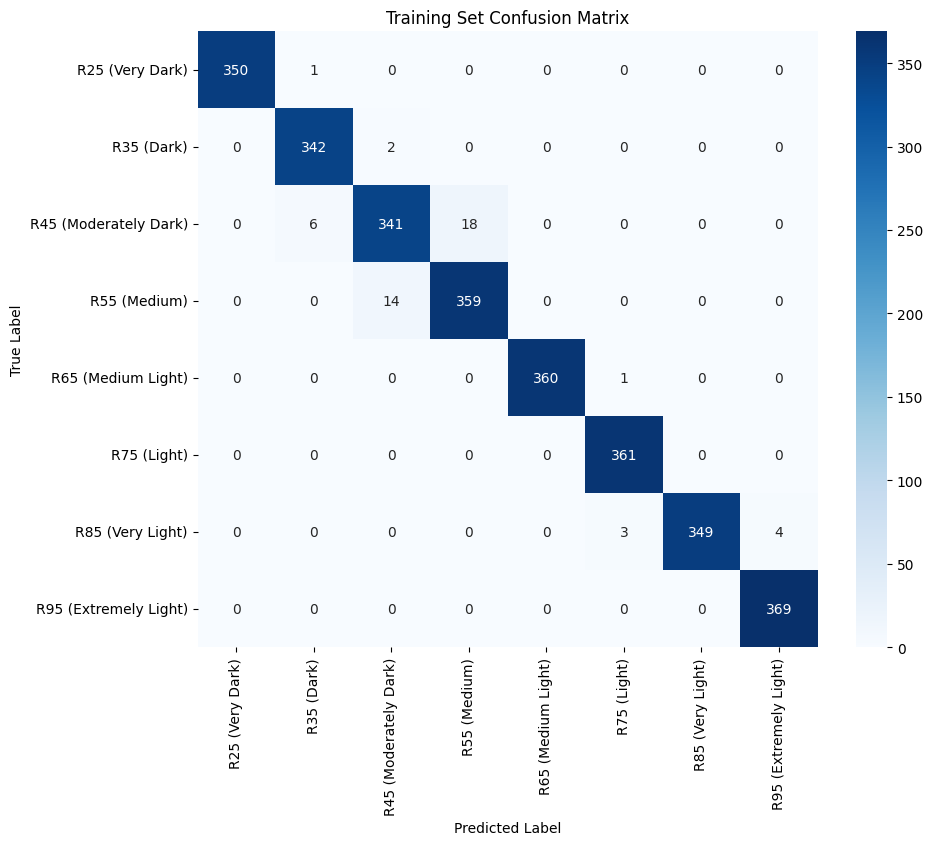

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Generate the confusion matrix for the training set
conf_matrix_train = confusion_matrix(all_true_labels_train, all_predicted_labels_train)

# Plot the confusion matrix for the training set
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues",
            xticklabels=target_names,
            yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Training Set Confusion Matrix')
plt.show()


### Test Set Evaluation

#### classification report

In [ ]:
# Load the best model weights
vit_model.load_state_dict(torch.load(best_model_path))
vit_model.eval()  # Set the model to evaluation mode

# Test set evaluation
correct_test = 0
total_test = 0

# Initialize lists to store true and predicted labels for the test set
all_true_labels = []
all_predicted_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = vit_model(inputs)
        _, predicted_test = torch.max(outputs, 1)

        # Store true and predicted labels
        all_true_labels.extend(labels.cpu().numpy())
        all_predicted_labels.extend(predicted_test.cpu().numpy())

        total_test += labels.size(0)
        correct_test += (predicted_test == labels).sum().item()

test_accuracy = 100 * correct_test / total_test
print(f'Test Accuracy: {test_accuracy}%')

# Calculate precision, recall, and F1-score for test set
report = classification_report(all_true_labels, all_predicted_labels, target_names=target_names)
print(report)


Test Accuracy: 98.33333333333333%
                       precision    recall  f1-score   support

      R25 (Very Dark)       1.00      1.00      1.00        45
           R35 (Dark)       1.00      0.98      0.99        59
R45 (Moderately Dark)       0.98      0.94      0.96        50
         R55 (Medium)       0.94      1.00      0.97        49
   R65 (Medium Light)       0.97      1.00      0.99        36
          R75 (Light)       1.00      0.97      0.98        33
     R85 (Very Light)       1.00      0.98      0.99        44
R95 (Extremely Light)       0.98      1.00      0.99        44

             accuracy                           0.98       360
            macro avg       0.98      0.98      0.98       360
         weighted avg       0.98      0.98      0.98       360



#### Confusion Matrix

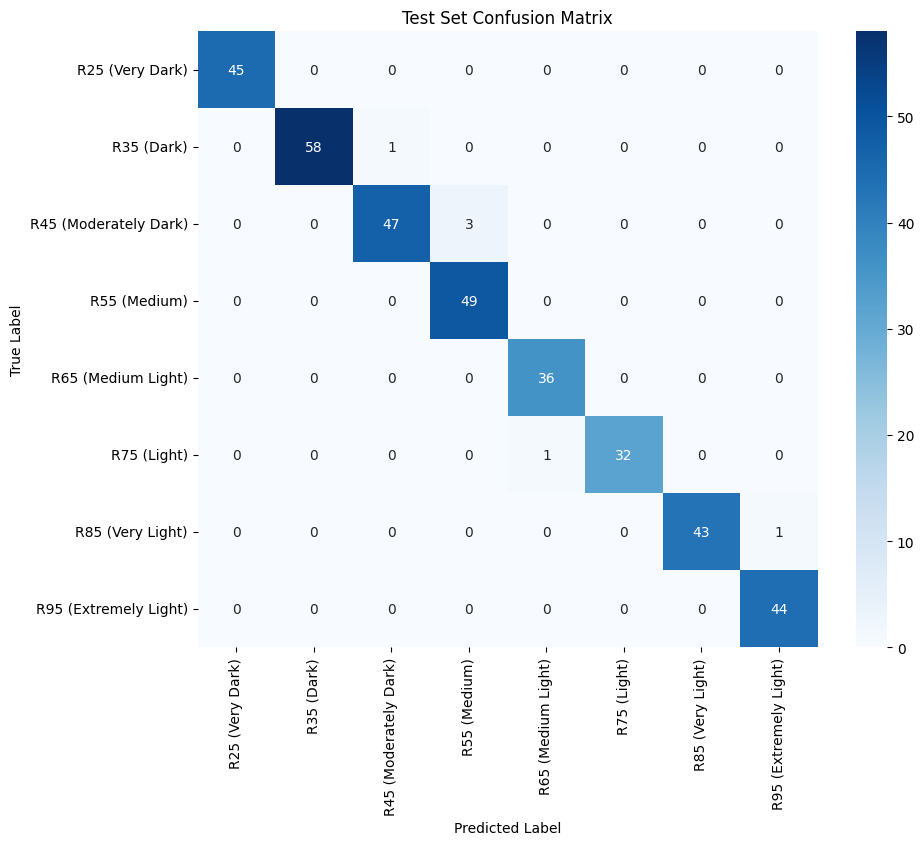

In [ ]:
# Generate the confusion matrix
conf_matrix = confusion_matrix(all_true_labels, all_predicted_labels)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=target_names,
            yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Test Set Confusion Matrix')
plt.show()


#### Show Graph

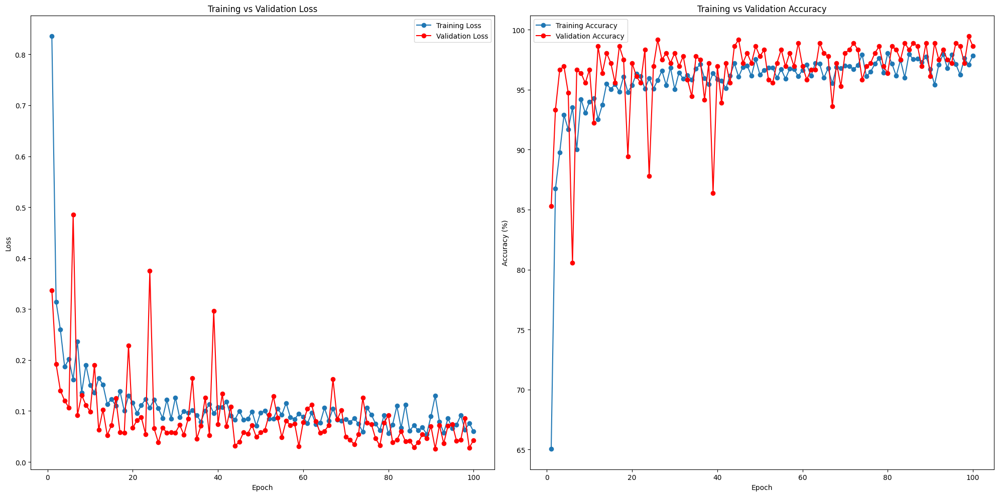

In [ ]:

# Plotting Loss (Training vs Validation)
plt.figure(figsize=(20, 10))

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies, label='Training Accuracy', marker='o')
plt.plot(range(1, num_epochs + 1), val_accuracies, label='Validation Accuracy', marker='o', color='red')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

# Loss
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs + 1), train_losses, label='Training Loss', marker='o')
plt.plot(range(1, num_epochs + 1), val_losses, label='Validation Loss', marker='o', color='red')
plt.title('Training vs Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


#### Save Model

In [ ]:
torch.save(vit_model.state_dict(), f"vit_b_32.pth")
